In [1]:
import os
import sys
import numpy as np
import pandas as pd
import xarray as xr
import geopandas as gpd
import seaborn as sns

import shapely.vectorized as sv

import cartopy.crs as ccrs
import cartopy.feature as cfeature

import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.gridspec as gridspec

sys.path.append(os.path.abspath("../.."))
from function import DOWN_raw

import warnings
warnings.filterwarnings('ignore')

In [2]:
dir_base = os.path.join('/','media','arturo','T9','Data','Italy','Satellite','2_MEV')

MEV_dir = os.path.join(dir_base, 'uncorrected', 'quantiles_v2')
obs_base = os.path.join('/','media','arturo','T9','Data','Italy','Rain_Gauges_QC')
dir_curves = os.path.join('..','..','output','autocorr','data')

In [3]:
GEOMETRY = gpd.read_file(os.path.join('..','..', 'geometry','Italy_simple.geojson'))

In [4]:
pos = 3
lon_min, lon_max, lat_min, lat_max, area = 6.5, 19, 36.5, 48, 'ITALY'
Tr = [5,  10,  20,  50, 100, 200]
Fi = 1 - 1/np.array(Tr)

In [5]:
DATA = xr.open_dataset(os.path.join(MEV_dir,'ITALY_DOWN_IMERG_1dy_2002_2023_npix_2_thr_1_acf_mar_genetic_pearson.nc'))
lon2d_IM, lat2d_IM = np.meshgrid(DATA.lon, DATA.lat)
NYd_IM = DATA.NYd.values
CYd_IM = DATA.CYd.values
WYd_IM = DATA.WYd.values
BETA_IM = DATA.BETA.values
GAMMA_IM = DATA.GAMMA.values

DATA = xr.open_dataset(os.path.join(MEV_dir,'ITALY_DOWN_CMORPH_3h_2002_2023_npix_2_thr_1_acf_mar_genetic_pearson.nc'))
lon2d_CM, lat2d_CM = np.meshgrid(DATA.lon, DATA.lat)
NYd_CM = DATA.NYd.values
CYd_CM = DATA.CYd.values
WYd_CM = DATA.WYd.values
BETA_CM = DATA.BETA.values
GAMMA_CM = DATA.GAMMA.values

DATA = xr.open_dataset(os.path.join(MEV_dir,'ITALY_DOWN_MSWEP_3h_2002_2023_npix_2_thr_1_acf_mar_genetic_pearson.nc'))
lon2d_MS, lat2d_MS = np.meshgrid(DATA.lon, DATA.lat)
NYd_MS = DATA.NYd.values
CYd_MS = DATA.CYd.values
WYd_MS = DATA.WYd.values
BETA_MS = DATA.BETA.values
GAMMA_MS = DATA.GAMMA.values

DATA = xr.open_dataset(os.path.join(MEV_dir,'ITALY_DOWN_ERA5_3h_2002_2023_npix_2_thr_1_acf_mar_genetic_pearson.nc'))
lon2d_ER, lat2d_ER = np.meshgrid(DATA.lon, DATA.lat)
NYd_ER = DATA.NYd.values
CYd_ER = DATA.CYd.values
WYd_ER = DATA.WYd.values
BETA_ER = DATA.BETA.values
GAMMA_ER = DATA.GAMMA.values

DATA = xr.open_dataset(os.path.join(MEV_dir,'ITALY_DOWN_GSMaP_3h_2002_2023_npix_3_thr_1_acf_mar_genetic_pearson.nc'))
lon2d_GS, lat2d_GS = np.meshgrid(DATA.lon, DATA.lat)
NYd_GS = DATA.NYd.values
CYd_GS = DATA.CYd.values
WYd_GS = DATA.WYd.values
BETA_GS = DATA.BETA.values
GAMMA_GS = DATA.GAMMA.values

DATA = xr.open_dataset(os.path.join(MEV_dir,'ITALY_DOWN_CHIRPS_1dy_2002_2023_npix_2_thr_1_acf_mar_genetic_pearson.nc'))
lon2d_CH, lat2d_CH = np.meshgrid(DATA.lon, DATA.lat)
NYd_CH = DATA.NYd.values
CYd_CH = DATA.CYd.values
WYd_CH = DATA.WYd.values
BETA_CH = DATA.BETA.values
GAMMA_CH = DATA.GAMMA.values

NYd_CH = np.where(NYd_CH==0,np.nan,NYd_CH)
CYd_CH = np.where(CYd_CH==0,np.nan,CYd_CH)
WYd_CH = np.where(WYd_CH==0,np.nan,WYd_CH)
BETA_CH = np.where(BETA_CH==0,np.nan,BETA_CH)
GAMMA_CH = np.where(GAMMA_CH==0,np.nan,GAMMA_CH)

DATA = xr.open_dataset(os.path.join(MEV_dir,'ITALY_DOWN_ENSEMBLE_median_1dy_2002_2023_npix_2_thr_1_acf_mar_genetic_pearson.nc'))
lon2d_EN, lat2d_EN = np.meshgrid(DATA.lon, DATA.lat)
NYd_EN = DATA.NYd.values
CYd_EN = DATA.CYd.values
WYd_EN = DATA.WYd.values

In [29]:
MEV_dir

'/media/arturo/T9/Data/Italy/Satellite/2_MEV/uncorrected/quantiles_v2'

In [6]:
dir_meta = os.path.join(obs_base, 'data', 'METADATA', 'METADATA_FTS_QCv4_Case1_wAIRHO_v3_1dy_CLEAR.csv')
METADATA = pd.read_csv(dir_meta)

file_list, lat_list, lon_list = [], [], []
NY, CY, WY = [], [], []

for nn in range(len(METADATA)):
    file = METADATA['File'].values[nn]
    ISO = METADATA['ISO'].values[nn]
    lon_obs = METADATA['Lon'].values[nn]
    lat_obs = METADATA['Lat'].values[nn]

    DF_OBS = pd.read_csv(os.path.join(obs_base,'Weibull','1dy',ISO,file)) 
    DF_OBS = DF_OBS.drop(columns='NaN')

    sat_pixel = DATA.sel(lat=lat_obs, lon=lon_obs, method='nearest')

    sat_n = sat_pixel.NYs.values
    sat_year = sat_pixel.year.values

    DF_SAT = pd.DataFrame({'Year':sat_pixel.year.values, 'Ns':sat_pixel.NYs.values, 'Cs':sat_pixel.CYs.values, 'Ws':sat_pixel.WYs.values})

    merged_df = pd.merge(DF_SAT, DF_OBS, on='Year', how='left')
    merged_df_clean = merged_df.dropna(subset=['N'])

    lat_list.append(lat_obs)
    lon_list.append(lon_obs)
    file_list.append(file)
    NY.append(np.nanmedian(merged_df_clean.N.values))
    CY.append(np.nanmedian(merged_df_clean.C.values))
    WY.append(np.nanmedian(merged_df_clean.W.values))

Quantile_df = pd.DataFrame({'file':file_list, 'lon':lon_list, 'lat':lat_list, 'NY':NY, 'CY':CY, 'WY':WY})

In [7]:
fonttitle = 12

In [8]:
NY_cmap = plt.cm.Spectral_r
NY_levels = np.arange(30, 250, 10)
NY_norm = mcolors.BoundaryNorm(boundaries=NY_levels, ncolors=NY_cmap.N, extend='max')
# NY_norm = None

Export figure to: ../../figures/parameters/NY_ALL_MEV_raw_50yrs.png


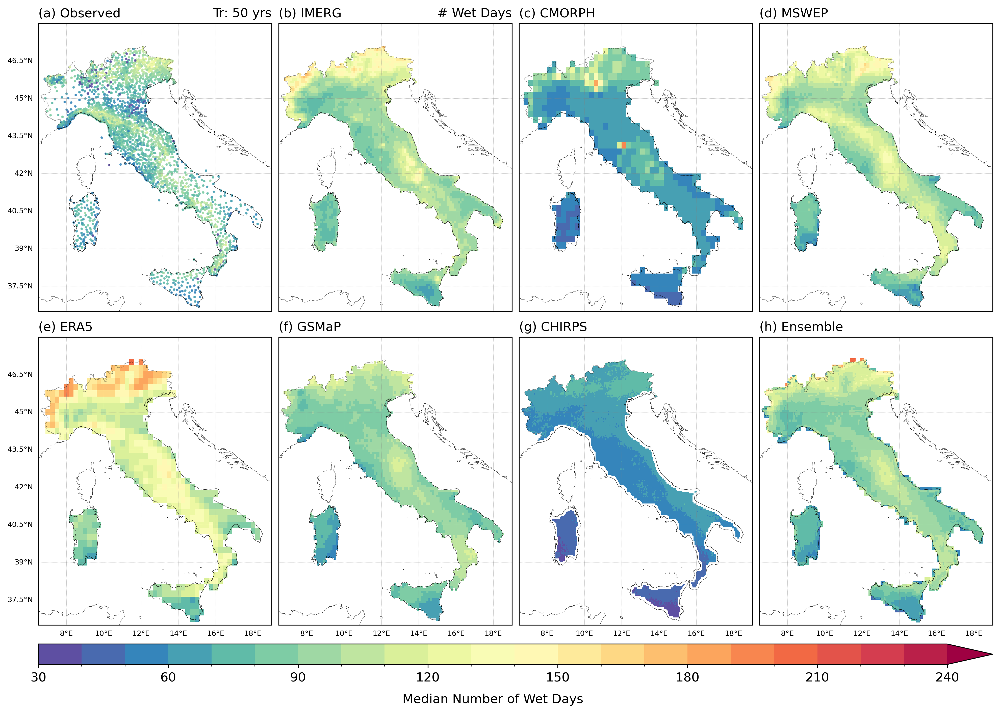

In [9]:
proj = ccrs.PlateCarree()

fig = plt.figure(figsize=(14,9),dpi=300)
gs = gridspec.GridSpec(2,4)

axes = []
for nraw in range(2):
    for ncol in range(4):
        ax = fig.add_subplot(gs[nraw, ncol], projection=proj)
        # DEM.plot(facecolor='None', edgecolor='k', ax=ax, linewidth=0.1, zorder=15, alpha=0.6)
        GEOMETRY.plot(facecolor='None', edgecolor='k', ax=ax, linewidth=0.3, zorder=21, alpha=0.5)
        ax.set_extent([lon_min, lon_max, lat_min, lat_max], crs=proj)
        ax.coastlines(linewidth=0.2)
        axes.append(ax)

        gl = ax.gridlines(crs=proj,draw_labels=True,linewidth=0.2,color='gray',alpha=0.5,linestyle='--')
        gl.top_labels = False
        if nraw == 1:
            gl.bottom_labels = True
        else:
            gl.bottom_labels = False
        gl.left_labels = False
        if ncol == 0:
            gl.left_labels = True
        gl.right_labels = False
        gl.xlabel_style = {'size': 7, 'color': 'k'}
        gl.ylabel_style = {'size': 7, 'color': 'k'}


a1 = axes[0].scatter(Quantile_df['lon'].values, Quantile_df['lat'].values, c=Quantile_df['NY'].values, s=2, alpha=0.8,cmap=NY_cmap,norm=NY_norm)
# cbar = plt.colorbar(a1, ax=axes[0], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[1].pcolormesh(lon2d_IM, lat2d_IM, np.nanmedian(NYd_IM,axis=0), cmap=NY_cmap, norm=NY_norm)
# cbar = plt.colorbar(a1, ax=axes[1], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[2].pcolormesh(lon2d_CM, lat2d_CM, np.nanmedian(NYd_CM,axis=0), cmap=NY_cmap, norm=NY_norm)
# cbar = plt.colorbar(a1, ax=axes[2], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[3].pcolormesh(lon2d_MS, lat2d_MS, np.nanmedian(NYd_MS,axis=0), cmap=NY_cmap, norm=NY_norm)
# cbar = plt.colorbar(a1, ax=axes[3], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[4].pcolormesh(lon2d_ER, lat2d_ER, np.nanmedian(NYd_ER,axis=0), cmap=NY_cmap, norm=NY_norm)
# cbar = plt.colorbar(a1, ax=axes[4], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[5].pcolormesh(lon2d_GS, lat2d_GS, np.nanmedian(NYd_GS,axis=0), cmap=NY_cmap, norm=NY_norm)
# cbar = plt.colorbar(a1, ax=axes[5], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[6].pcolormesh(lon2d_CH, lat2d_CH, np.nanmedian(NYd_CH,axis=0), cmap=NY_cmap, norm=NY_norm)
# cbar = plt.colorbar(a1, ax=axes[6], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[7].pcolormesh(lon2d_EN, lat2d_EN, np.nanmedian(NYd_EN,axis=0), cmap=NY_cmap, norm=NY_norm)
# cbar = plt.colorbar(a1, ax=axes[7], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

axes[0].set_title('(a) Observed', fontsize=fonttitle, loc='left')
axes[0].set_title(f'Tr: {Tr[pos]} yrs', fontsize=fonttitle, loc='right')

axes[1].set_title('(b) IMERG', fontsize=fonttitle, loc='left')
axes[1].set_title(f'# Wet Days', fontsize=fonttitle, loc='right')

axes[2].set_title('(c) CMORPH', fontsize=fonttitle, loc='left')

axes[3].set_title('(d) MSWEP', fontsize=fonttitle, loc='left')

axes[4].set_title('(e) ERA5', fontsize=fonttitle, loc='left')

axes[5].set_title('(f) GSMaP', fontsize=fonttitle, loc='left')

axes[6].set_title('(g) CHIRPS', fontsize=fonttitle, loc='left')

axes[7].set_title('(h) Ensemble', fontsize=fonttitle, loc='left')

cbar_ax = fig.add_axes([0.05, 0.0, 0.9, 0.03]) # Horizontal
cbar = fig.colorbar(a1, cax=cbar_ax, orientation='horizontal')
cbar.ax.tick_params(labelsize=12)
cbar.set_label(f"Median Number of Wet Days", fontsize=12, labelpad=9)

# ===========================================================================================================================================================================
# ===========================================================================================================================================================================
plt.subplots_adjust(left=0.05, bottom=0.05, right=0.95, top=0.95, wspace=0.03, hspace=0.05)

salida = os.path.join('..','..','figures','parameters',f'NY_ALL_MEV_raw_{Tr[pos]}yrs.png')
print(f'Export figure to: {salida}')
plt.savefig(salida,transparent = False,bbox_inches ='tight',pad_inches = 0.1, facecolor=None)


In [10]:
CY_cmap = plt.cm.Spectral_r
CY_levels = np.arange(1, 16, 1)
CY_norm = mcolors.BoundaryNorm(boundaries=CY_levels, ncolors=CY_cmap.N, extend='max')
# CY_norm = None

Export figure to: ../../figures/parameters/CY_ALL_MEV_raw_50yrs.png


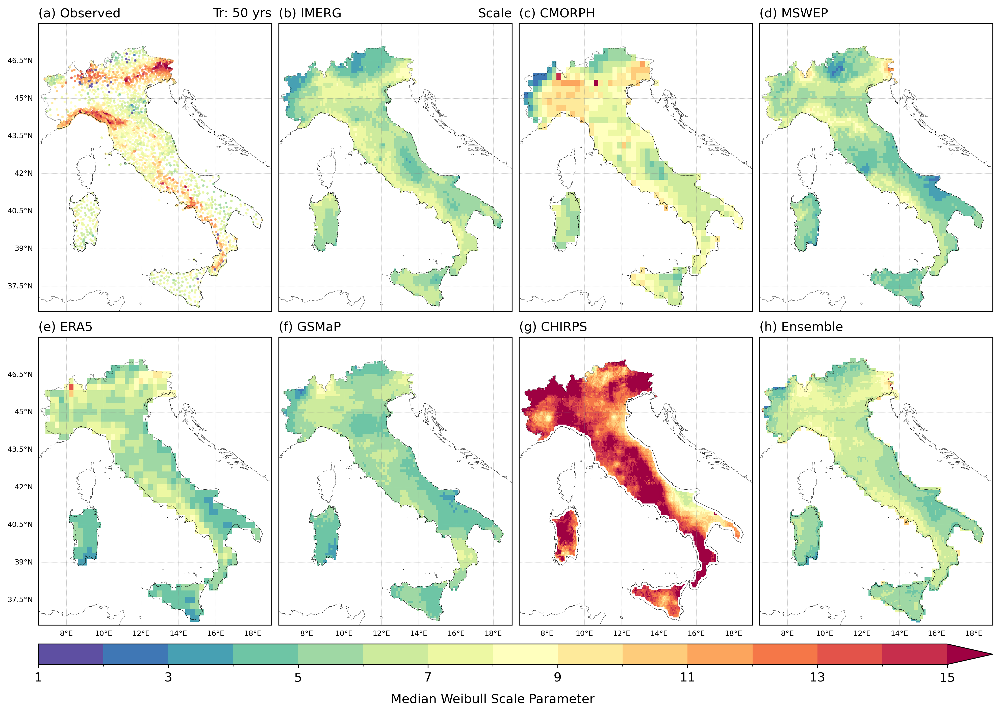

In [11]:
proj = ccrs.PlateCarree()

fig = plt.figure(figsize=(14,9),dpi=300)
gs = gridspec.GridSpec(2,4)

axes = []
for nraw in range(2):
    for ncol in range(4):
        ax = fig.add_subplot(gs[nraw, ncol], projection=proj)
        # DEM.plot(facecolor='None', edgecolor='k', ax=ax, linewidth=0.1, zorder=15, alpha=0.6)
        GEOMETRY.plot(facecolor='None', edgecolor='k', ax=ax, linewidth=0.3, zorder=21, alpha=0.5)
        ax.set_extent([lon_min, lon_max, lat_min, lat_max], crs=proj)
        ax.coastlines(linewidth=0.2)
        axes.append(ax)

        gl = ax.gridlines(crs=proj,draw_labels=True,linewidth=0.2,color='gray',alpha=0.5,linestyle='--')
        gl.top_labels = False
        if nraw == 1:
            gl.bottom_labels = True
        else:
            gl.bottom_labels = False
        gl.left_labels = False
        if ncol == 0:
            gl.left_labels = True
        gl.right_labels = False
        gl.xlabel_style = {'size': 7, 'color': 'k'}
        gl.ylabel_style = {'size': 7, 'color': 'k'}


a1 = axes[0].scatter(Quantile_df['lon'].values, Quantile_df['lat'].values, c=Quantile_df['CY'].values, s=2, alpha=0.8,cmap=CY_cmap,norm=CY_norm)
# cbar = plt.colorbar(a1, ax=axes[0], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[1].pcolormesh(lon2d_IM, lat2d_IM, np.nanmedian(CYd_IM,axis=0), cmap=CY_cmap, norm=CY_norm)
# cbar = plt.colorbar(a1, ax=axes[1], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[2].pcolormesh(lon2d_CM, lat2d_CM, np.nanmedian(CYd_CM,axis=0), cmap=CY_cmap, norm=CY_norm)
# cbar = plt.colorbar(a1, ax=axes[2], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[3].pcolormesh(lon2d_MS, lat2d_MS, np.nanmedian(CYd_MS,axis=0), cmap=CY_cmap, norm=CY_norm)
# cbar = plt.colorbar(a1, ax=axes[3], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[4].pcolormesh(lon2d_ER, lat2d_ER, np.nanmedian(CYd_ER,axis=0), cmap=CY_cmap, norm=CY_norm)
# cbar = plt.colorbar(a1, ax=axes[4], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[5].pcolormesh(lon2d_GS, lat2d_GS, np.nanmedian(CYd_GS,axis=0), cmap=CY_cmap, norm=CY_norm)
# cbar = plt.colorbar(a1, ax=axes[5], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[6].pcolormesh(lon2d_CH, lat2d_CH, np.nanmedian(CYd_CH,axis=0), cmap=CY_cmap, norm=CY_norm)
# cbar = plt.colorbar(a1, ax=axes[6], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[7].pcolormesh(lon2d_EN, lat2d_EN, np.nanmedian(CYd_EN,axis=0), cmap=CY_cmap, norm=CY_norm)
# cbar = plt.colorbar(a1, ax=axes[7], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

axes[0].set_title('(a) Observed', fontsize=fonttitle, loc='left')
axes[0].set_title(f'Tr: {Tr[pos]} yrs', fontsize=fonttitle, loc='right')

axes[1].set_title('(b) IMERG', fontsize=fonttitle, loc='left')
axes[1].set_title(f'Scale', fontsize=fonttitle, loc='right')

axes[2].set_title('(c) CMORPH', fontsize=fonttitle, loc='left')

axes[3].set_title('(d) MSWEP', fontsize=fonttitle, loc='left')

axes[4].set_title('(e) ERA5', fontsize=fonttitle, loc='left')

axes[5].set_title('(f) GSMaP', fontsize=fonttitle, loc='left')

axes[6].set_title('(g) CHIRPS', fontsize=fonttitle, loc='left')

axes[7].set_title('(h) Ensemble', fontsize=fonttitle, loc='left')

cbar_ax = fig.add_axes([0.05, 0.0, 0.9, 0.03]) # Horizontal
cbar = fig.colorbar(a1, cax=cbar_ax, orientation='horizontal')
cbar.ax.tick_params(labelsize=12)
cbar.set_label(f"Median Weibull Scale Parameter", fontsize=12, labelpad=9)

# ===========================================================================================================================================================================
# ===========================================================================================================================================================================
plt.subplots_adjust(left=0.05, bottom=0.05, right=0.95, top=0.95, wspace=0.03, hspace=0.05)

salida = os.path.join('..','..','figures','parameters',f'CY_ALL_MEV_raw_{Tr[pos]}yrs.png')
print(f'Export figure to: {salida}')
plt.savefig(salida,transparent = False,bbox_inches ='tight',pad_inches = 0.1, facecolor=None)


In [12]:
WY_cmap = plt.cm.Spectral_r
WY_levels = np.arange(0.5, 1.05, 0.05)
WY_norm = mcolors.BoundaryNorm(boundaries=WY_levels, ncolors=WY_cmap.N, extend='max')
# WY_norm = None

Export figure to: ../../figures/parameters/WY_ALL_MEV_raw_50yrs.png


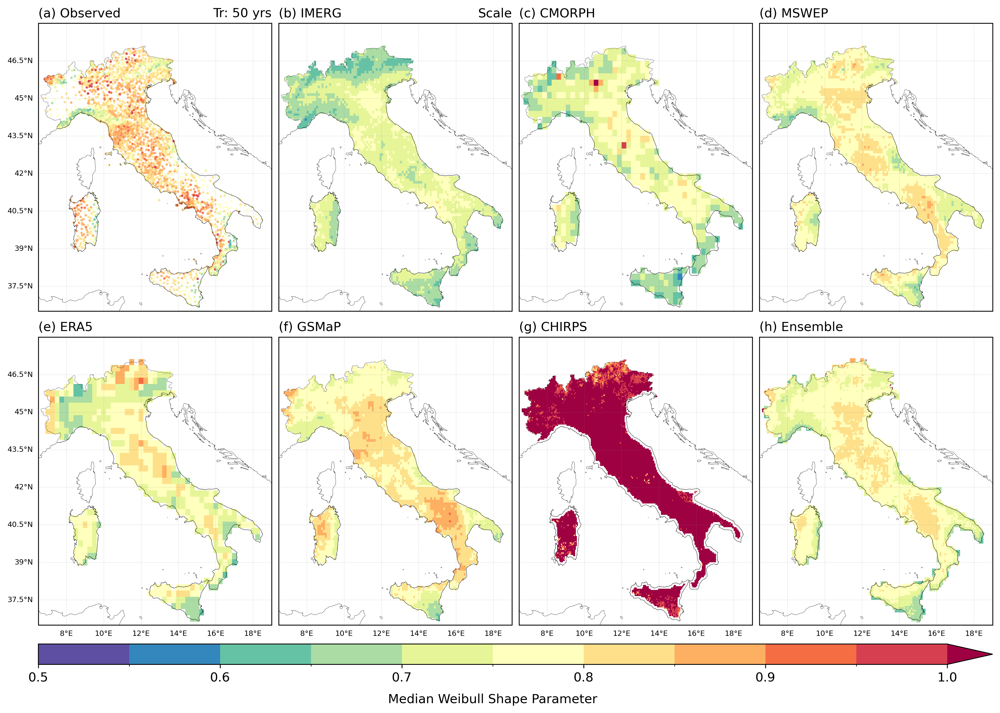

In [13]:
proj = ccrs.PlateCarree()

fig = plt.figure(figsize=(14,9),dpi=300)
gs = gridspec.GridSpec(2,4)

axes = []
for nraw in range(2):
    for ncol in range(4):
        ax = fig.add_subplot(gs[nraw, ncol], projection=proj)
        # DEM.plot(facecolor='None', edgecolor='k', ax=ax, linewidth=0.1, zorder=15, alpha=0.6)
        GEOMETRY.plot(facecolor='None', edgecolor='k', ax=ax, linewidth=0.3, zorder=21, alpha=0.5)
        ax.set_extent([lon_min, lon_max, lat_min, lat_max], crs=proj)
        ax.coastlines(linewidth=0.2)
        axes.append(ax)

        gl = ax.gridlines(crs=proj,draw_labels=True,linewidth=0.2,color='gray',alpha=0.5,linestyle='--')
        gl.top_labels = False
        if nraw == 1:
            gl.bottom_labels = True
        else:
            gl.bottom_labels = False
        gl.left_labels = False
        if ncol == 0:
            gl.left_labels = True
        gl.right_labels = False
        gl.xlabel_style = {'size': 7, 'color': 'k'}
        gl.ylabel_style = {'size': 7, 'color': 'k'}


a1 = axes[0].scatter(Quantile_df['lon'].values, Quantile_df['lat'].values, c=Quantile_df['WY'].values, s=2 , alpha=0.8,cmap=WY_cmap,norm=WY_norm)
# cbar = plt.colorbar(a1, ax=axes[0], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[1].pcolormesh(lon2d_IM, lat2d_IM, np.nanmedian(WYd_IM,axis=0), cmap=WY_cmap, norm=WY_norm)
# cbar = plt.colorbar(a1, ax=axes[1], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[2].pcolormesh(lon2d_CM, lat2d_CM, np.nanmedian(WYd_CM,axis=0), cmap=WY_cmap, norm=WY_norm)
# cbar = plt.colorbar(a1, ax=axes[2], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[3].pcolormesh(lon2d_MS, lat2d_MS, np.nanmedian(WYd_MS,axis=0), cmap=WY_cmap, norm=WY_norm)
# cbar = plt.colorbar(a1, ax=axes[3], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[4].pcolormesh(lon2d_ER, lat2d_ER, np.nanmedian(WYd_ER,axis=0), cmap=WY_cmap, norm=WY_norm)
# cbar = plt.colorbar(a1, ax=axes[4], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[5].pcolormesh(lon2d_GS, lat2d_GS, np.nanmedian(WYd_GS,axis=0), cmap=WY_cmap, norm=WY_norm)
# cbar = plt.colorbar(a1, ax=axes[5], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[6].pcolormesh(lon2d_CH, lat2d_CH, np.nanmedian(WYd_CH,axis=0), cmap=WY_cmap, norm=WY_norm)
# cbar = plt.colorbar(a1, ax=axes[6], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[7].pcolormesh(lon2d_EN, lat2d_EN, np.nanmedian(WYd_EN,axis=0), cmap=WY_cmap, norm=WY_norm)
# cbar = plt.colorbar(a1, ax=axes[7], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

axes[0].set_title('(a) Observed', fontsize=fonttitle, loc='left')
axes[0].set_title(f'Tr: {Tr[pos]} yrs', fontsize=fonttitle, loc='right')

axes[1].set_title('(b) IMERG', fontsize=fonttitle, loc='left')
axes[1].set_title(f'Scale', fontsize=fonttitle, loc='right')

axes[2].set_title('(c) CMORPH', fontsize=fonttitle, loc='left')

axes[3].set_title('(d) MSWEP', fontsize=fonttitle, loc='left')

axes[4].set_title('(e) ERA5', fontsize=fonttitle, loc='left')

axes[5].set_title('(f) GSMaP', fontsize=fonttitle, loc='left')

axes[6].set_title('(g) CHIRPS', fontsize=fonttitle, loc='left')

axes[7].set_title('(h) Ensemble', fontsize=fonttitle, loc='left')

cbar_ax = fig.add_axes([0.05, 0.0, 0.9, 0.03]) # Horizontal
cbar = fig.colorbar(a1, cax=cbar_ax, orientation='horizontal')
cbar.ax.tick_params(labelsize=12)
cbar.set_label(f"Median Weibull Shape Parameter", fontsize=12, labelpad=9)

# ===========================================================================================================================================================================
# ===========================================================================================================================================================================
plt.subplots_adjust(left=0.05, bottom=0.05, right=0.95, top=0.95, wspace=0.03, hspace=0.05)

salida = os.path.join('..','..','figures','parameters',f'WY_ALL_MEV_raw_{Tr[pos]}yrs.png')
print(f'Export figure to: {salida}')
plt.savefig(salida,transparent = False,bbox_inches ='tight',pad_inches = 0.1, facecolor=None)


In [14]:
BETA_cmap = plt.cm.Blues
BETA_levels = np.arange(1, 1.21, 0.01)
BETA_norm = mcolors.BoundaryNorm(boundaries=BETA_levels, ncolors=BETA_cmap.N, extend='max')
# BETA_norm = None

In [15]:
fonttitle = 12

Export figure to: ../../figures/parameters/BETA_ALL_MEV_raw_50yrs.png


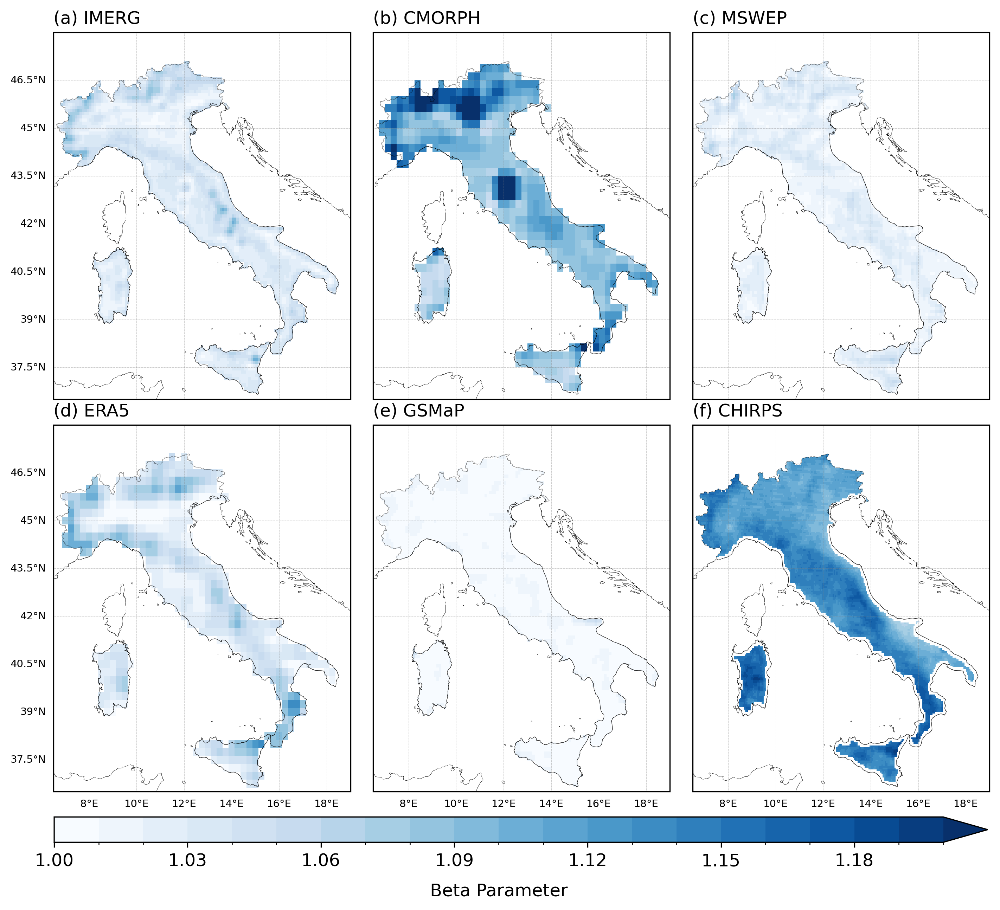

In [16]:
proj = ccrs.PlateCarree()

fig = plt.figure(figsize=(10,8),dpi=300)
gs = gridspec.GridSpec(2,3)

axes = []
for nraw in range(2):
    for ncol in range(3):
        ax = fig.add_subplot(gs[nraw, ncol], projection=proj)
        # DEM.plot(facecolor='None', edgecolor='k', ax=ax, linewidth=0.1, zorder=15, alpha=0.6)
        GEOMETRY.plot(facecolor='None', edgecolor='k', ax=ax, linewidth=0.3, zorder=21, alpha=0.5)
        ax.set_extent([lon_min, lon_max, lat_min, lat_max], crs=proj)
        ax.coastlines(linewidth=0.2)
        axes.append(ax)

        gl = ax.gridlines(crs=proj,draw_labels=True,linewidth=0.2,color='gray',alpha=0.5,linestyle='--')
        gl.top_labels = False
        if nraw == 1:
            gl.bottom_labels = True
        else:
            gl.bottom_labels = False
        gl.left_labels = False
        if ncol == 0:
            gl.left_labels = True
        gl.right_labels = False
        gl.xlabel_style = {'size': 7, 'color': 'k'}
        gl.ylabel_style = {'size': 7, 'color': 'k'}


a1 = axes[0].pcolormesh(lon2d_IM, lat2d_IM, BETA_IM, cmap=BETA_cmap, norm=BETA_norm)
a2 = axes[1].pcolormesh(lon2d_CM, lat2d_CM, BETA_CM, cmap=BETA_cmap, norm=BETA_norm)
a3 = axes[2].pcolormesh(lon2d_MS, lat2d_MS, BETA_MS, cmap=BETA_cmap, norm=BETA_norm)
a4 = axes[3].pcolormesh(lon2d_ER, lat2d_ER, BETA_ER, cmap=BETA_cmap, norm=BETA_norm)
a5 = axes[4].pcolormesh(lon2d_GS, lat2d_GS, BETA_GS, cmap=BETA_cmap, norm=BETA_norm)
a6 = axes[5].pcolormesh(lon2d_CH, lat2d_CH, BETA_CH, cmap=BETA_cmap, norm=BETA_norm)

# cbar = plt.colorbar(a1, ax=axes[0], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)
# cbar = plt.colorbar(a2, ax=axes[1], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)
# cbar = plt.colorbar(a3, ax=axes[2], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)
# cbar = plt.colorbar(a4, ax=axes[3], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)
# cbar = plt.colorbar(a5, ax=axes[4], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)
# cbar = plt.colorbar(a6, ax=axes[5], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

axes[0].set_title('(a) IMERG', fontsize=fonttitle, loc='left')
axes[1].set_title('(b) CMORPH', fontsize=fonttitle, loc='left')
axes[2].set_title('(c) MSWEP', fontsize=fonttitle, loc='left')
axes[3].set_title('(d) ERA5', fontsize=fonttitle, loc='left')
axes[4].set_title('(e) GSMaP', fontsize=fonttitle, loc='left')
axes[5].set_title('(f) CHIRPS', fontsize=fonttitle, loc='left')

cbar_ax = fig.add_axes([0.057, -0.01, 0.885, 0.03]) # Horizontal
cbar = fig.colorbar(a1, cax=cbar_ax, orientation='horizontal')
cbar.ax.tick_params(labelsize=12)
cbar.set_label(f"Beta Parameter", fontsize=12, labelpad=9)

# ===========================================================================================================================================================================
# ===========================================================================================================================================================================
plt.subplots_adjust(left=0.05, bottom=0.05, right=0.95, top=0.95, wspace=0.03, hspace=0.07)

salida = os.path.join('..','..','figures','parameters',f'BETA_ALL_MEV_raw_{Tr[pos]}yrs.png')
print(f'Export figure to: {salida}')
# plt.savefig(salida,transparent = False,bbox_inches ='tight',pad_inches = 0.1, facecolor=None)

In [17]:
GAMMA_cmap = plt.cm.Reds
GAMMA_levels = np.arange(0.5, 1.01, 0.01)
GAMMA_norm = mcolors.BoundaryNorm(boundaries=GAMMA_levels, ncolors=GAMMA_cmap.N, extend='max')
# GAMMA_norm = None

Export figure to: ../../figures/parameters/GAMMA_ALL_MEV_raw_50yrs.png


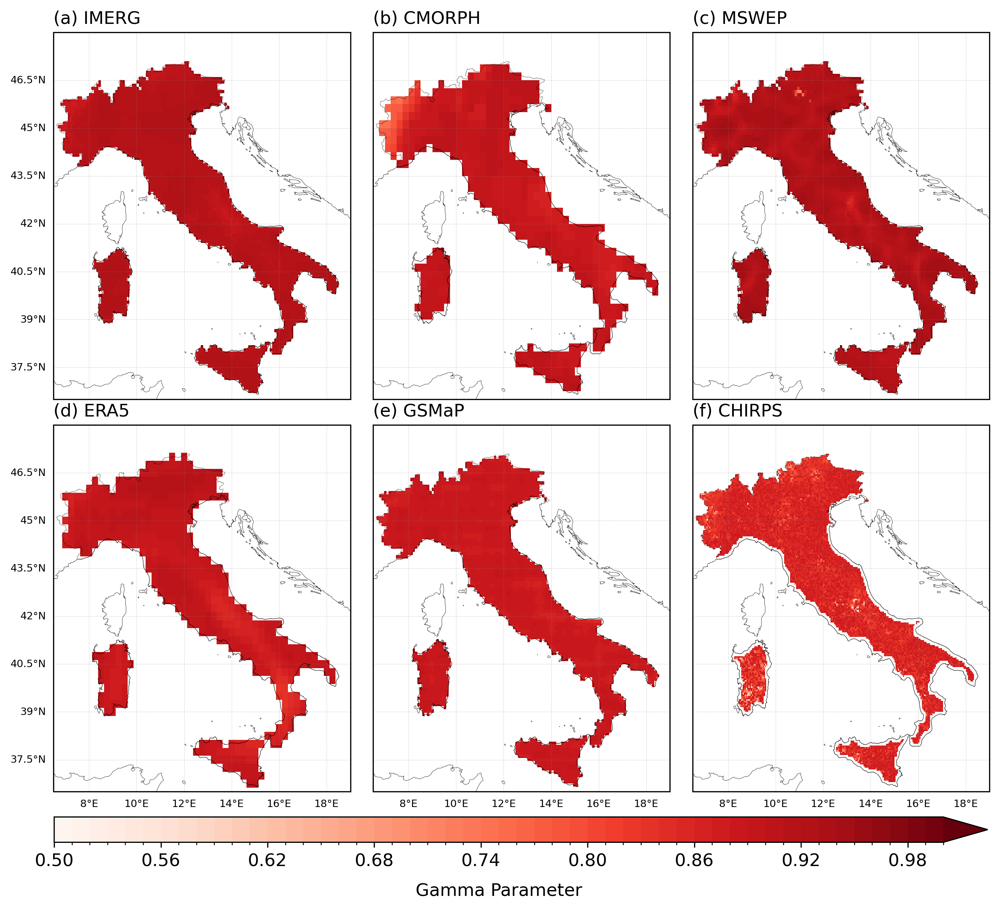

In [18]:
proj = ccrs.PlateCarree()

fig = plt.figure(figsize=(10,8),dpi=300)
gs = gridspec.GridSpec(2,3)

axes = []
for nraw in range(2):
    for ncol in range(3):
        ax = fig.add_subplot(gs[nraw, ncol], projection=proj)
        # DEM.plot(facecolor='None', edgecolor='k', ax=ax, linewidth=0.1, zorder=15, alpha=0.6)
        GEOMETRY.plot(facecolor='None', edgecolor='k', ax=ax, linewidth=0.3, zorder=21, alpha=0.5)
        ax.set_extent([lon_min, lon_max, lat_min, lat_max], crs=proj)
        ax.coastlines(linewidth=0.2)
        axes.append(ax)

        gl = ax.gridlines(crs=proj,draw_labels=True,linewidth=0.2,color='gray',alpha=0.5,linestyle='--')
        gl.top_labels = False
        if nraw == 1:
            gl.bottom_labels = True
        else:
            gl.bottom_labels = False
        gl.left_labels = False
        if ncol == 0:
            gl.left_labels = True
        gl.right_labels = False
        gl.xlabel_style = {'size': 7, 'color': 'k'}
        gl.ylabel_style = {'size': 7, 'color': 'k'}


a1 = axes[0].pcolormesh(lon2d_IM, lat2d_IM, GAMMA_IM, cmap=GAMMA_cmap, norm=GAMMA_norm)
a2 = axes[1].pcolormesh(lon2d_CM, lat2d_CM, GAMMA_CM, cmap=GAMMA_cmap, norm=GAMMA_norm)
a3 = axes[2].pcolormesh(lon2d_MS, lat2d_MS, GAMMA_MS, cmap=GAMMA_cmap, norm=GAMMA_norm)
a4 = axes[3].pcolormesh(lon2d_ER, lat2d_ER, GAMMA_ER, cmap=GAMMA_cmap, norm=GAMMA_norm)
a5 = axes[4].pcolormesh(lon2d_GS, lat2d_GS, GAMMA_GS, cmap=GAMMA_cmap, norm=GAMMA_norm)
a6 = axes[5].pcolormesh(lon2d_CH, lat2d_CH, GAMMA_CH, cmap=GAMMA_cmap, norm=GAMMA_norm)

# cbar = plt.colorbar(a1, ax=axes[0], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)
# cbar = plt.colorbar(a2, ax=axes[1], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)
# cbar = plt.colorbar(a3, ax=axes[2], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)
# cbar = plt.colorbar(a4, ax=axes[3], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)
# cbar = plt.colorbar(a5, ax=axes[4], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)
# cbar = plt.colorbar(a6, ax=axes[5], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

axes[0].set_title('(a) IMERG', fontsize=fonttitle, loc='left')
axes[1].set_title('(b) CMORPH', fontsize=fonttitle, loc='left')
axes[2].set_title('(c) MSWEP', fontsize=fonttitle, loc='left')
axes[3].set_title('(d) ERA5', fontsize=fonttitle, loc='left')
axes[4].set_title('(e) GSMaP', fontsize=fonttitle, loc='left')
axes[5].set_title('(f) CHIRPS', fontsize=fonttitle, loc='left')

cbar_ax = fig.add_axes([0.057, -0.01, 0.885, 0.03]) # Horizontal
cbar = fig.colorbar(a1, cax=cbar_ax, orientation='horizontal')
cbar.ax.tick_params(labelsize=12)
cbar.set_label(f"Gamma Parameter", fontsize=12, labelpad=9)

# ===========================================================================================================================================================================
# ===========================================================================================================================================================================
plt.subplots_adjust(left=0.05, bottom=0.05, right=0.95, top=0.95, wspace=0.03, hspace=0.07)

salida = os.path.join('..','..','figures','parameters',f'GAMMA_ALL_MEV_raw_{Tr[pos]}yrs.png')
print(f'Export figure to: {salida}')
# plt.savefig(salida,transparent = False,bbox_inches ='tight',pad_inches = 0.1, facecolor=None)

In [19]:
method = 'pearson'

# IMERG
input_file = os.path.join(dir_curves,f'IMERG_Npix_2_mar_{method}.csv')
IMERG_2 = pd.read_csv(input_file)

# CMORPH
input_file = os.path.join(dir_curves,f'CMORPH_Npix_2_mar_{method}.csv')
CMORPH_2 = pd.read_csv(input_file)

# MSWEP
input_file = os.path.join(dir_curves,f'MSWEP_Npix_2_mar_{method}.csv')
MSWEP_2 = pd.read_csv(input_file)

# ERA5
input_file = os.path.join(dir_curves,f'ERA5_Npix_2_mar_{method}.csv')
ERA5_2 = pd.read_csv(input_file)

# GSMaP
input_file = os.path.join(dir_curves,f'GSMaP_Npix_2_mar_{method}.csv')
GSMaP_2 = pd.read_csv(input_file)	
GSMaP_2 = GSMaP_2.rename(columns={'eps': 'epsilon', 'alp': 'alpha'})

# CHIRPS
input_file = os.path.join(dir_curves,f'CHIRPS_Npix_2_mar_{method}.csv')
CHIRPS_2 = pd.read_csv(input_file)	

In [20]:
dir_out = os.path.join('..','..','output','autocorr','dist',f'IMERG_Npix_2.csv')
dist = pd.read_csv(dir_out)
IMERG_dist_2 = dist.dist.values

dir_out = os.path.join('..','..','output','autocorr','dist',f'CMORPH_Npix_2.csv')
dist = pd.read_csv(dir_out)
CMORPH_dist_2 = dist.dist.values

dir_out = os.path.join('..','..','output','autocorr','dist',f'MSWEP_Npix_2.csv')
dist = pd.read_csv(dir_out)
MSWEP_dist_2 = dist.dist.values

dir_out = os.path.join('..','..','output','autocorr','dist',f'ERA5_Npix_2.csv')
dist = pd.read_csv(dir_out)
ERA5_dist_2 = dist.dist.values

dir_out = os.path.join('..','..','output','autocorr','dist',f'GSMaP_Npix_2.csv')
dist = pd.read_csv(dir_out)
GSMaP_dist_2 = dist.dist.values

dir_out = os.path.join('..','..','output','autocorr','dist',f'CHIRPS_Npix_2.csv')
dist = pd.read_csv(dir_out)
CHIRPS_dist_2 = dist.dist.values

In [21]:
def median_curve(curves, distance):
    todas_las_curvas = []
    for nn in range(len(curves)):
        y_vals = DOWN_raw.epl_fun(distance, curves['epsilon'].iloc[nn], curves['alpha'].iloc[nn])
        todas_las_curvas.append(y_vals)

    ALL = np.array(todas_las_curvas)
    median = np.median(ALL, axis=0)
    p25 = np.percentile(ALL, 25, axis=0)
    p75 = np.percentile(ALL, 75, axis=0)

    return median, p25, p75

In [22]:
IMERG_median, IMERG_p25, IMERG_p75 = median_curve(IMERG_2, IMERG_dist_2)
CMORPH_median, CMORPH_p25, CMORPH_p75 = median_curve(CMORPH_2, CMORPH_dist_2)
MSWEP_median, MSWEP_p25, MSWEP_p75 = median_curve(MSWEP_2, MSWEP_dist_2)
ERA5_median, ERA5_p25, ERA5_p75 = median_curve(ERA5_2, ERA5_dist_2)
GSMaP_median, GSMaP_p25, GSMaP_p75 = median_curve(GSMaP_2, GSMaP_dist_2)
CHIRPS_median, CHIRPS_p25, CHIRPS_p75 = median_curve(CHIRPS_2, CHIRPS_dist_2)

In [23]:
colors = ['royalblue','r', 'g', 'c', 'y', 'purple', 'orange', 'cyan']

In [24]:
BETA_IM_list =BETA_IM[~np.isnan(BETA_IM)]
BETA_CM_list =BETA_CM[~np.isnan(BETA_CM)]
BETA_MS_list =BETA_MS[~np.isnan(BETA_MS)]
BETA_ER_list =BETA_ER[~np.isnan(BETA_ER)]
BETA_GS_list =BETA_GS[~np.isnan(BETA_GS)]
BETA_CH_list =BETA_CH[~np.isnan(BETA_CH)]

In [25]:
GAMMA_IM_list =GAMMA_IM[~np.isnan(GAMMA_IM)]
GAMMA_CM_list =GAMMA_CM[~np.isnan(GAMMA_CM)]
GAMMA_MS_list =GAMMA_MS[~np.isnan(GAMMA_MS)]
GAMMA_ER_list =GAMMA_ER[~np.isnan(GAMMA_ER)]
GAMMA_GS_list =GAMMA_GS[~np.isnan(GAMMA_GS)]
GAMMA_CH_list =GAMMA_CH[~np.isnan(GAMMA_CH)]    

Export figure to: ../../figures/parameters/Beta_Gamma_50yrs.png


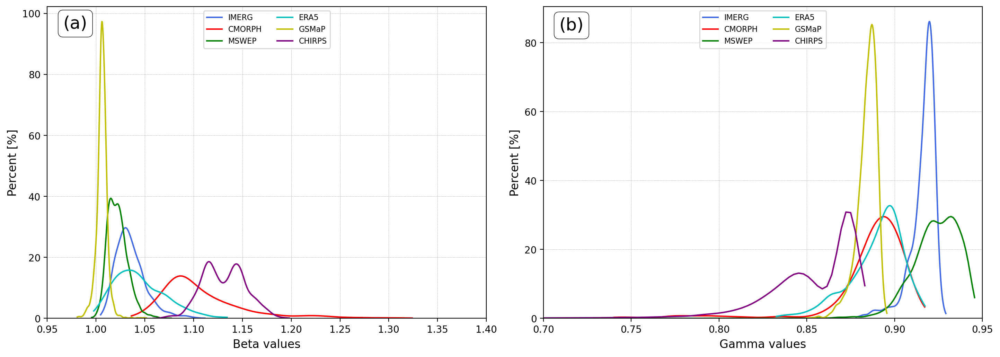

In [26]:
fig = plt.figure(figsize=(15,5),dpi=200)
gs = gridspec.GridSpec(1,2)

# ==========================================================================================================================
ax1 = plt.subplot(gs[0, 0])

sns.kdeplot(BETA_IM_list,color=colors[0],cumulative=False,fill=False,multiple="stack",ax=ax1,label=f'IMERG',
            clip=(np.nanmin(np.array(BETA_IM_list)), np.nanmax(np.array(BETA_IM_list))))
sns.kdeplot(BETA_CM_list,color=colors[1],cumulative=False,fill=False,multiple="stack",ax=ax1,label=f'CMORPH',
            clip=(np.nanmin(np.array(BETA_CM_list)), np.nanmax(np.array(BETA_CM_list))))
sns.kdeplot(BETA_MS_list,color=colors[2],cumulative=False,fill=False,multiple="stack",ax=ax1,label=f'MSWEP',
            clip=(np.nanmin(np.array(BETA_MS_list)), np.nanmax(np.array(BETA_MS_list))))
sns.kdeplot(BETA_ER_list,color=colors[3],cumulative=False,fill=False,multiple="stack",ax=ax1,label=f'ERA5',
            clip=(np.nanmin(np.array(BETA_ER_list)), np.nanmax(np.array(BETA_ER_list))))
sns.kdeplot(BETA_GS_list,color=colors[4],cumulative=False,fill=False,multiple="stack",ax=ax1,label=f'GSMaP',
            clip=(np.nanmin(np.array(BETA_GS_list)), np.nanmax(np.array(BETA_GS_list))))
sns.kdeplot(BETA_CH_list,color=colors[5],cumulative=False,fill=False,multiple="stack",ax=ax1,label=f'CHIRPS',
            clip=(np.nanmin(np.array(BETA_CH_list)), np.nanmax(np.array(BETA_CH_list))))

ax1.legend(fontsize=8, loc=9, ncol=2)
ax1.grid(linewidth=0.3, linestyle='--')
ax1.set_xlim(0.95, 1.4)
ax1.set_ylabel('Percent [%]',fontsize=12)
ax1.set_xlabel('Beta values',fontsize=12)

ax1.text(0.064, 0.946, '(a)', 
            fontsize=18, ha='center', va='center',
            transform=ax1.transAxes, zorder=20,
            bbox=dict(boxstyle="round,pad=0.3", 
                facecolor="white", 
                alpha=1,
                edgecolor="black",
                linewidth=0.5))

# ==========================================================================================================================
ax1 = plt.subplot(gs[0, 1])

sns.kdeplot(GAMMA_IM_list,color=colors[0],cumulative=False,fill=False,multiple="stack",ax=ax1,label=f'IMERG',
            clip=(np.nanmin(np.array(GAMMA_IM_list)), np.nanmax(np.array(GAMMA_IM_list))))
sns.kdeplot(GAMMA_CM_list,color=colors[1],cumulative=False,fill=False,multiple="stack",ax=ax1,label=f'CMORPH',
            clip=(np.nanmin(np.array(GAMMA_CM_list)), np.nanmax(np.array(GAMMA_CM_list))))
sns.kdeplot(GAMMA_MS_list,color=colors[2],cumulative=False,fill=False,multiple="stack",ax=ax1,label=f'MSWEP',
            clip=(np.nanmin(np.array(GAMMA_MS_list)), np.nanmax(np.array(GAMMA_MS_list))))
sns.kdeplot(GAMMA_ER_list,color=colors[3],cumulative=False,fill=False,multiple="stack",ax=ax1,label=f'ERA5',
            clip=(np.nanmin(np.array(GAMMA_ER_list)), np.nanmax(np.array(GAMMA_ER_list))))
sns.kdeplot(GAMMA_GS_list,color=colors[4],cumulative=False,fill=False,multiple="stack",ax=ax1,label=f'GSMaP',
            clip=(np.nanmin(np.array(GAMMA_GS_list)), np.nanmax(np.array(GAMMA_GS_list))))
sns.kdeplot(GAMMA_CH_list,color=colors[5],cumulative=False,fill=False,multiple="stack",ax=ax1,label=f'CHIRPS',
            clip=(np.nanmin(np.array(GAMMA_CH_list)), np.nanmax(np.array(GAMMA_CH_list))))

ax1.legend(fontsize=8, loc=9, ncol=2)
ax1.grid(linewidth=0.3, linestyle='--')
ax1.set_xlim(0.7, 0.95)
ax1.set_ylabel('Percent [%]',fontsize=12)
ax1.set_xlabel('Gamma values',fontsize=12)

ax1.text(0.064, 0.94, '(b)', 
            fontsize=18, ha='center', va='center',
            transform=ax1.transAxes, zorder=20,
            bbox=dict(boxstyle="round,pad=0.3", 
                facecolor="white", 
                alpha=1,
                edgecolor="black",
                linewidth=0.5))

# ==========================================================================================================================
# ==========================================================================================================================
plt.subplots_adjust(left=0.05, bottom=0.05, right=0.95, top=0.95, wspace=0.13, hspace=0.07)

salida = os.path.join('..','..','figures','parameters',f'Beta_Gamma_{Tr[pos]}yrs.png')
print(f'Export figure to: {salida}')
plt.savefig(salida,transparent = False,bbox_inches ='tight',pad_inches = 0.1, facecolor=None)

Export figure to: ../../figures/parameters/Corr_Beta_Gamma_50yrs.png


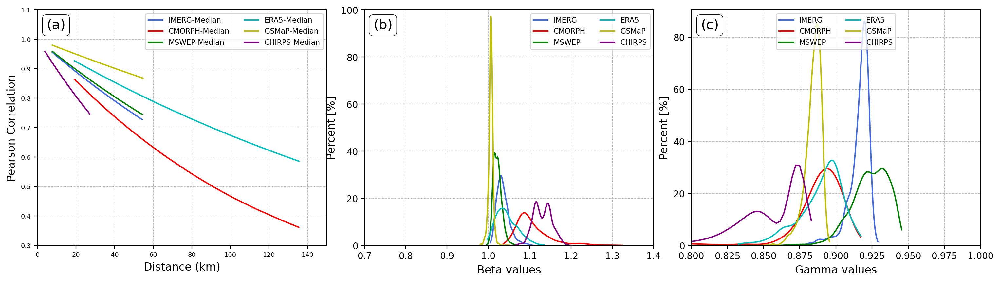

In [30]:
fig = plt.figure(figsize=(16, 4), dpi=200)
gs = gridspec.GridSpec(1, 3)

# ==========================================================================================================
ax1 = plt.subplot(gs[0, 0])

ax1.plot(IMERG_dist_2, IMERG_median, linewidth=1.5, linestyle='-', color=colors[0], label='IMERG-Median')
ax1.plot(CMORPH_dist_2, CMORPH_median, linewidth=1.5, linestyle='-', color=colors[1], label='CMORPH-Median')
ax1.plot(MSWEP_dist_2, MSWEP_median, linewidth=1.5, linestyle='-', color=colors[2], label='MSWEP-Median')
ax1.plot(ERA5_dist_2, ERA5_median, linewidth=1.5, linestyle='-', color=colors[3], label='ERA5-Median')
ax1.plot(GSMaP_dist_2, GSMaP_median, linewidth=1.5, linestyle='-', color=colors[4], label='GSMaP-Median')
ax1.plot(CHIRPS_dist_2, CHIRPS_median, linewidth=1.5, linestyle='-', color=colors[5], label='CHIRPS-Median')

ax1.set_xlim(0,150)
ax1.set_ylim(0.3,1.1)
ax1.legend(fontsize=8,loc=1, ncol=2)
ax1.grid(linewidth=0.3, linestyle='--')
ax1.tick_params(axis='both', which='major', labelsize=7)

ax1.set_xlabel('Distance (km)',fontsize=12)
ax1.set_ylabel('Pearson Correlation',fontsize=12)

ax1.text(0.064, 0.935, '(a)', 
            fontsize=15, ha='center', va='center',
            transform=ax1.transAxes, zorder=20,
            bbox=dict(boxstyle="round,pad=0.3", 
                facecolor="white", 
                alpha=1,
                edgecolor="black",
                linewidth=0.5))

# ==========================================================================================================================
ax1 = plt.subplot(gs[0, 1])

sns.kdeplot(BETA_IM_list,color=colors[0],cumulative=False,fill=False,multiple="stack",ax=ax1,label=f'IMERG',
            clip=(np.nanmin(np.array(BETA_IM_list)), np.nanmax(np.array(BETA_IM_list))))
sns.kdeplot(BETA_CM_list,color=colors[1],cumulative=False,fill=False,multiple="stack",ax=ax1,label=f'CMORPH',
            clip=(np.nanmin(np.array(BETA_CM_list)), np.nanmax(np.array(BETA_CM_list))))
sns.kdeplot(BETA_MS_list,color=colors[2],cumulative=False,fill=False,multiple="stack",ax=ax1,label=f'MSWEP',
            clip=(np.nanmin(np.array(BETA_MS_list)), np.nanmax(np.array(BETA_MS_list))))
sns.kdeplot(BETA_ER_list,color=colors[3],cumulative=False,fill=False,multiple="stack",ax=ax1,label=f'ERA5',
            clip=(np.nanmin(np.array(BETA_ER_list)), np.nanmax(np.array(BETA_ER_list))))
sns.kdeplot(BETA_GS_list,color=colors[4],cumulative=False,fill=False,multiple="stack",ax=ax1,label=f'GSMaP',
            clip=(np.nanmin(np.array(BETA_GS_list)), np.nanmax(np.array(BETA_GS_list))))
sns.kdeplot(BETA_CH_list,color=colors[5],cumulative=False,fill=False,multiple="stack",ax=ax1,label=f'CHIRPS',
            clip=(np.nanmin(np.array(BETA_CH_list)), np.nanmax(np.array(BETA_CH_list))))

ax1.legend(fontsize=8, loc=1, ncol=2)
ax1.grid(linewidth=0.3, linestyle='--')
ax1.set_xlim(0.7, 1.4)
ax1.set_ylim(0, 100)
ax1.set_ylabel('Percent [%]',fontsize=12)
ax1.set_xlabel('Beta values',fontsize=12)

ax1.text(0.064, 0.935, '(b)', 
            fontsize=15, ha='center', va='center',
            transform=ax1.transAxes, zorder=20,
            bbox=dict(boxstyle="round,pad=0.3", 
                facecolor="white", 
                alpha=1,
                edgecolor="black",
                linewidth=0.5))

# ==========================================================================================================================
ax1 = plt.subplot(gs[0, 2])

sns.kdeplot(GAMMA_IM_list,color=colors[0],cumulative=False,fill=False,multiple="stack",ax=ax1,label=f'IMERG',
            clip=(np.nanmin(np.array(GAMMA_IM_list)), np.nanmax(np.array(GAMMA_IM_list))))
sns.kdeplot(GAMMA_CM_list,color=colors[1],cumulative=False,fill=False,multiple="stack",ax=ax1,label=f'CMORPH',
            clip=(np.nanmin(np.array(GAMMA_CM_list)), np.nanmax(np.array(GAMMA_CM_list))))
sns.kdeplot(GAMMA_MS_list,color=colors[2],cumulative=False,fill=False,multiple="stack",ax=ax1,label=f'MSWEP',
            clip=(np.nanmin(np.array(GAMMA_MS_list)), np.nanmax(np.array(GAMMA_MS_list))))
sns.kdeplot(GAMMA_ER_list,color=colors[3],cumulative=False,fill=False,multiple="stack",ax=ax1,label=f'ERA5',
            clip=(np.nanmin(np.array(GAMMA_ER_list)), np.nanmax(np.array(GAMMA_ER_list))))
sns.kdeplot(GAMMA_GS_list,color=colors[4],cumulative=False,fill=False,multiple="stack",ax=ax1,label=f'GSMaP',
            clip=(np.nanmin(np.array(GAMMA_GS_list)), np.nanmax(np.array(GAMMA_GS_list))))
sns.kdeplot(GAMMA_CH_list,color=colors[5],cumulative=False,fill=False,multiple="stack",ax=ax1,label=f'CHIRPS',
            clip=(np.nanmin(np.array(GAMMA_CH_list)), np.nanmax(np.array(GAMMA_CH_list))))

ax1.legend(fontsize=8, loc=9, ncol=2)
ax1.grid(linewidth=0.3, linestyle='--')
ax1.set_xlim(0.8, 1)
ax1.set_ylabel('Percent [%]',fontsize=12)
ax1.set_xlabel('Gamma values',fontsize=12)

ax1.text(0.064, 0.935, '(c)', 
            fontsize=15, ha='center', va='center',
            transform=ax1.transAxes, zorder=20,
            bbox=dict(boxstyle="round,pad=0.3", 
                facecolor="white", 
                alpha=1,
                edgecolor="black",
                linewidth=0.5))

# ==========================================================================================================================
# ==========================================================================================================================
plt.subplots_adjust(left=0.05, bottom=0.05, right=0.95, top=0.95, wspace=0.13, hspace=0.07)

salida = os.path.join('..','..','figures','parameters',f'Corr_Beta_Gamma_{Tr[pos]}yrs.png')
print(f'Export figure to: {salida}')
plt.savefig(salida,transparent = False,bbox_inches ='tight',pad_inches = 0.1, facecolor=None)